<a href="https://colab.research.google.com/github/MayerT1/PIPECAST/blob/main/Alaska_PIPECAST_Sensitivity_Experiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

PIPECAST Wrokflow for Alaska via hrrak

In [22]:
# ✅ Install Herbie
!pip install herbie-data --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.5/113.5 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.5/83.5 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.9/20.9 MB 26.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 MB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 89.3 MB/s eta 0:00:00


In [4]:
!pip install rasterio

In [6]:
import os
import json
from datetime import datetime
import geopandas as gpd
import rasterio
from rasterio import features
from scipy.ndimage import label
from shapely.geometry import shape
from herbie import Herbie
import numpy as np

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
# import geopandas as gpd

# # Load your dataset (replace with your actual path)
# df = gpd.read_file("/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts/unzipped_merged_census_pop_blocks_nation_wide_final.csv")

# # Ensure STATEFP is string and padded
# df["STATEFP"] = df["STATEFP"].astype(str).str.zfill(2)

# # Filter for Alaska (FIPS 02)
# df_ak = df[df["STATEFP"] == "02"]

# print("Number of Alaska census blocks:", len(df_ak))
# df_ak.head()


Number of Alaska census blocks: 504


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,geometry,Population
3923,G02001300001001,02,013,000100,1,020130001001,Block Group 1,G5030,S,6108247597.0,7397503478.0,+54.7466525,-164.0702890,1809490.11767,6163509461.85,MULTIPOLYGON (((-4159737.3994999994 3381190.19...,2039
3924,G02001300001002,02,013,000100,2,020130001002,Block Group 2,G5030,S,10804142413.0,9287872466.0,+55.5139021,-161.7288604,2233374.68,10880010297.6,"MULTIPOLYGON (((-3956093.3246 3370319.8596, -3...",802
3925,G02001300001003,02,013,000100,3,020130001003,Block Group 3,G5030,S,1179282523.0,4114475186.0,+55.0952467,-160.0272746,1111494.48944,1179796954.28,"MULTIPOLYGON (((-3955024.1457 3291265.3926, -3...",579
3926,G02001600001001,02,016,000100,1,020160001001,Block Group 1,G5030,S,8556804421.0,22079077527.0,+51.9594469,+178.3388130,4077887.88713,8583489033.82,MULTIPOLYGON (((-4559842.521299999 3541726.125...,978
3927,G02001600002001,02,016,000200,1,020160002001,Block Group 1,G5030,S,773173926.0,644338456.0,+53.8584232,-166.8901785,204828.852057,773173942.493,MULTIPOLYGON (((-4408220.708900001 3523220.101...,1750


In [14]:
# !pwd

/content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts


In [13]:
# %cd /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts

/content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts


In [16]:
# from shapely import wkt
# import geopandas as gpd

# # Convert the geometry column from text to shapely geometry
# df_ak["geometry"] = df_ak["geometry"].apply(wkt.loads)

# # Now convert to GeoDataFrame
# gdf_ak = gpd.GeoDataFrame(df_ak, geometry="geometry")

# # Assign CRS (same as your Texas example)
# gdf_ak = gdf_ak.set_crs(epsg=4326)

# # Save as shapefile
# gdf_ak.to_file("Alaska_block_groups_with_pop.shp", driver="ESRI Shapefile")


/tmp/ipython-input-2286684394.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ak["geometry"] = df_ak["geometry"].apply(wkt.loads)


# Census Data

In [17]:
import geopandas as gpd

# Path to your joined shapefile
output_shp = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts/Alaska_block_groups_with_pop.shp"

# Load it into a GeoDataFrame
census_gdf = gpd.read_file(output_shp)

# Check the first rows and columns
print(census_gdf.head())
print(census_gdf.columns)
print(census_gdf.crs)  # Check coordinate reference system

           GISJOIN STATEFP COUNTYFP TRACTCE BLKGRPCE         GEOID  \
0  G02001300001001      02      013  000100        1  020130001001   
1  G02001300001002      02      013  000100        2  020130001002   
2  G02001300001003      02      013  000100        3  020130001003   
3  G02001600001001      02      016  000100        1  020160001001   
4  G02001600002001      02      016  000200        1  020160002001   

        NAMELSAD  MTFCC FUNCSTAT          ALAND         AWATER     INTPTLAT  \
0  Block Group 1  G5030        S   6108247597.0   7397503478.0  +54.7466525   
1  Block Group 2  G5030        S  10804142413.0   9287872466.0  +55.5139021   
2  Block Group 3  G5030        S   1179282523.0   4114475186.0  +55.0952467   
3  Block Group 1  G5030        S   8556804421.0  22079077527.0  +51.9594469   
4  Block Group 1  G5030        S    773173926.0    644338456.0  +53.8584232   

       INTPTLON     Shape_Leng     Shape_Area Population  \
0  -164.0702890  1809490.11767  6163509461.8

# Watershed Data

In [18]:
import geopandas as gpd

# Path to your joined shapefile
# watershed_output_shp = "/content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/USGS_High_Res_Watersheds/texas_wbdhu12.shp"

watershed_output_shp = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/USGS_High_Res_Watersheds/Alaska_Clipped/Alaska_huc_12.shp"

# Load it into a GeoDataFrame
gdf_watershed_tx = gpd.read_file(watershed_output_shp)

# Check the first rows and columns
print(gdf_watershed_tx.head())
print(gdf_watershed_tx.columns)
print(gdf_watershed_tx.crs)  # Check coordinate reference system

  noncontr00 sourcedata  areaacres humod sourcefeat         huc12  \
0       None       None    8979.71    NC       None  190504041301   
1       None       None    8093.37    NC       None  190504041306   
2       None       None   15385.26    NC       None  190504031906   
3       None       None  160901.35    NM       None  190602051104   
4       None       None  106136.31    NM       None  190602042305   

          shape_leng         tohuc states sourceorig           shape_area  \
0  0.579228209569992  CLOSED BASIN     AK       None  0.00776665342948425   
1  0.418360803020589  CLOSED BASIN     AK       None  0.00687393205765567   
2  0.668894533628807  CLOSED BASIN     AK       None    0.012845484720199   
3   3.02968066004094         OCEAN     AK       None    0.157879107893197   
4   3.40087416111126         OCEAN     AK       None    0.105249166472113   

  areasqkm hutype                               name  \
0    36.34      C                    Tatigirok Creek   
1    32.75

# Sensitivity Experiment  

In [19]:
# Pick a common CRS (WGS84 for mapping or projected CRS for area calcs)
target_crs = "EPSG:4326"

# forecast_aoi = gdf.to_crs(target_crs)
gdf_tx_census = census_gdf.to_crs(target_crs)
gdf_tx = gdf_watershed_tx.to_crs(target_crs)

## Paramaters

In [20]:
# --- PARAMETERS ---
# forecast_dates = ["2025-07-04", "2025-07-03", "2025-07-02", "2025-07-01"]
forecast_dates = ["2025-10-07", "2025-10-08", "2025-10-09", "2025-10-10"]
thresholds = [5, 39, 50, 100, 254, 255]  # threshold mm
forecast_methods = ["standard", "enhanced"]
target_crs = "EPSG:4326"
fxx_list = [0, 4, 8, 12, 16, 20, 24]  # forecast times to evaluate

In [24]:
import os
import json
from datetime import datetime
import geopandas as gpd
import rasterio
from rasterio import features
from scipy.ndimage import label
from shapely.geometry import shape
from herbie import Herbie
import numpy as np


# --- OUTPUT DIRECTORY ---
out_dir = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25"
os.makedirs(out_dir, exist_ok=True)

results = {}

# --- LOOP OVER DAYS, METHODS, THRESHOLDS, FORECAST HOURS ---
for method in forecast_methods:
    method_dir = os.path.join(out_dir, method)
    os.makedirs(method_dir, exist_ok=True)
    results[method] = {}

    for date_str in forecast_dates:
        date_dir = os.path.join(method_dir, date_str)
        os.makedirs(date_dir, exist_ok=True)
        results[method][date_str] = {}

        date = datetime.strptime(date_str, "%Y-%m-%d")

        for fxx in fxx_list:
            # Load HRRR forecast
            H = Herbie(date, model="hrrrak", product="sfc", fxx=fxx, verbose=False)
            #H = Herbie(date, model="hrrr", product="sfc", fxx=fxx, verbose=False)
            ds = H.xarray("APCP:surface")
            precip_data = ds["tp"].values

            # Build transform for geolocation
            transform = rasterio.transform.from_bounds(
                float(ds.longitude.min()), float(ds.latitude.min()),
                float(ds.longitude.max()), float(ds.latitude.max()),
                ds.dims["x"], ds.dims["y"]
            )

            # Loop over thresholds
            for threshold in thresholds:
                mask = precip_data > threshold
                labeled, num_features = label(mask)
                shapes = list(rasterio.features.shapes(labeled.astype(np.int16), mask=mask, transform=transform))

                polygons = []
                ids = []
                mean_precips = []

                for geom, label_id in shapes:
                    if label_id == 0:
                        continue
                    poly = shape(geom)
                    if poly.area > 0.01:
                        aoi_mask = labeled == label_id
                        mean_precip = float(precip_data[aoi_mask].mean())
                        polygons.append(poly)
                        ids.append(label_id)
                        mean_precips.append(mean_precip)

                # Build AOI GeoDataFrame
                gdf_aoi = gpd.GeoDataFrame({
                    'id': ids,
                    'mean_precip_mm': mean_precips
                }, geometry=polygons, crs="EPSG:4326")

                # Intersect with Census and Watersheds
                census_intersect = gpd.overlay(gdf_aoi, gdf_tx_census, how='intersection')
                ws_intersect = gpd.overlay(gdf_aoi, gdf_tx, how='intersection')

                # Compute summary values
                census_pop_sum = census_intersect['U7H001'].sum() if not census_intersect.empty else 0
                ws_area_sum = ws_intersect.geometry.area.sum() if not ws_intersect.empty else 0

                # Store in results dict
                key = f"F{fxx}_T{threshold}"
                results[method][date_str][key] = {
                    'forecast_hour': fxx,
                    'num_aois': len(polygons),
                    'mean_precip_over_aois': np.mean(mean_precips) if mean_precips else 0,
                    'census_pop_sum': census_pop_sum,
                    'watershed_area_sum': ws_area_sum
                }

                # Save AOI GeoJSON
                out_gdf_path = os.path.join(date_dir, f"{key}_aois.geojson")
                gdf_aoi.to_file(out_gdf_path, driver="GeoJSON")

# Save results dictionary
summary_path = os.path.join(out_dir, "experiment_summary_with_fxx.json")
with open(summary_path, "w") as f:
    json.dump(results, f, indent=4)

print(f"Experiment complete. Results saved to {summary_path}")


/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds.dims["x"], ds.dims["y"]
/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds.dims["x"], ds.dims["y"]
/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds.dims["x"], ds.dims["y"]
/tmp/ipython-input-1700616531.py:79: UserWarning: Geometry is in

👨🏻‍🏭 Created directory: [/root/data/hrrrak/20251008]


/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds.dims["x"], ds.dims["y"]
/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds.dims["x"], ds.dims["y"]
/tmp/ipython-input-1700616531.py:79: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ws_area_sum = ws_intersect.geometry.area.sum() if not ws_intersect.empty else 0
/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Data

👨🏻‍🏭 Created directory: [/root/data/hrrrak/20251009]


/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds.dims["x"], ds.dims["y"]
/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds.dims["x"], ds.dims["y"]
/tmp/ipython-input-1700616531.py:79: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ws_area_sum = ws_intersect.geometry.area.sum() if not ws_intersect.empty else 0
/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Data

👨🏻‍🏭 Created directory: [/root/data/hrrrak/20251010]


/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds.dims["x"], ds.dims["y"]
/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds.dims["x"], ds.dims["y"]
/tmp/ipython-input-1700616531.py:43: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds.dims["x"], ds.dims["y"]
/tmp/ipython-input-1700616531.py:79: UserWarning: Geometry is in

Experiment complete. Results saved to /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/experiment_summary_with_fxx.json


## Plotting all AOIS

In [ ]:
# import os
# import geopandas as gpd
# import matplotlib.pyplot as plt

# root_dir = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment"

# geojson_files = []
# labels = []

# for method in os.listdir(root_dir):
#     method_dir = os.path.join(root_dir, method)
#     if not os.path.isdir(method_dir):
#         continue
#     for date_str in os.listdir(method_dir):
#         date_dir = os.path.join(method_dir, date_str)
#         if not os.path.isdir(date_dir):
#             continue
#         for file in os.listdir(date_dir):
#             if file.endswith(".geojson"):
#                 geojson_files.append(os.path.join(date_dir, file))
#                 label = f"{method} | {date_str} | {file.replace('_aois.geojson','')}"
#                 labels.append(label)

# n_files = len(geojson_files)
# n_cols = 4
# n_rows = (n_files + n_cols - 1) // n_cols

# fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))
# axes = axes.flatten()

# for idx, (gjson, label) in enumerate(zip(geojson_files, labels)):
#     gdf = gpd.read_file(gjson)
#     ax = axes[idx]

#     if not gdf.empty:
#         gdf.boundary.plot(ax=ax, color='blue')
#         ax.set_aspect('equal')
#     else:
#         ax.text(0.5, 0.5, 'No AOIs', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
#         ax.set_aspect('auto')

#     ax.set_title(label, fontsize=8)
#     ax.set_xticks([])
#     ax.set_yticks([])

# # Hide extra axes
# for j in range(idx+1, len(axes)):
#     axes[j].axis('off')

# plt.tight_layout()
# plt.show()


## Plot 16 AOIS (reduced to keep the workflow managable)

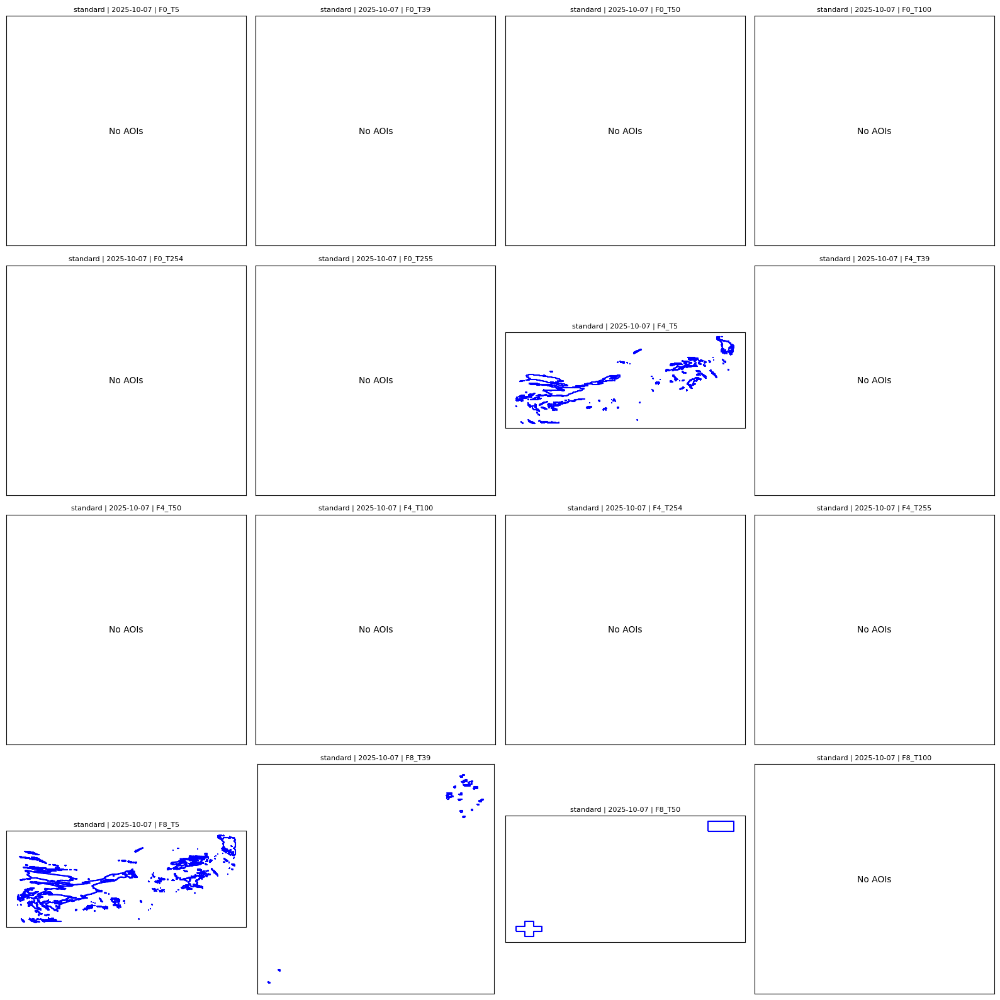

KeyboardInterrupt: Interrupted by user

In [25]:
import os
import geopandas as gpd
import matplotlib.pyplot as plt

root_dir = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25"

geojson_files = []
labels = []

for method in os.listdir(root_dir):
    method_dir = os.path.join(root_dir, method)
    if not os.path.isdir(method_dir):
        continue
    for date_str in os.listdir(method_dir):
        date_dir = os.path.join(method_dir, date_str)
        if not os.path.isdir(date_dir):
            continue
        for file in os.listdir(date_dir):
            if file.endswith(".geojson"):
                geojson_files.append(os.path.join(date_dir, file))
                label = f"{method} | {date_str} | {file.replace('_aois.geojson','')}"
                labels.append(label)

batch_size = 16
n_files = len(geojson_files)

for start_idx in range(0, n_files, batch_size):
    end_idx = min(start_idx + batch_size, n_files)
    batch_files = geojson_files[start_idx:end_idx]
    batch_labels = labels[start_idx:end_idx]

    n_cols = 4
    n_rows = (len(batch_files) + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))
    axes = axes.flatten()

    for idx, (gjson, label) in enumerate(zip(batch_files, batch_labels)):
        gdf = gpd.read_file(gjson)
        ax = axes[idx]

        if not gdf.empty:
            gdf.boundary.plot(ax=ax, color='blue')
            ax.set_aspect('equal')
        else:
            ax.text(0.5, 0.5, 'No AOIs', ha='center', va='center', transform=ax.transAxes)
            ax.set_aspect('auto')

        ax.set_title(label, fontsize=8)
        ax.set_xticks([])
        ax.set_yticks([])

    # Hide any unused axes
    for j in range(len(batch_files), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

    # Pause between batches unless this is the last one
    if end_idx < n_files:
        input(f"Displayed {end_idx} of {n_files} graphs. Press Enter to continue...")


## Mapping all AOIs

In [ ]:
# import os
# import folium
# import geopandas as gpd

# # --- ROOT DIRECTORY ---
# root_dir = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment"

# # --- Create base map (centered roughly over Texas for example) ---
# m = folium.Map(location=[31.0, -99.0], zoom_start=6, tiles="CartoDB positron")

# # --- Loop through all AOIs ---
# for method in os.listdir(root_dir):
#     method_dir = os.path.join(root_dir, method)
#     if not os.path.isdir(method_dir):
#         continue

#     for date_str in os.listdir(method_dir):
#         date_dir = os.path.join(method_dir, date_str)
#         if not os.path.isdir(date_dir):
#             continue

#         for file in os.listdir(date_dir):
#             if not file.endswith(".geojson"):
#                 continue

#             gdf_aoi = gpd.read_file(os.path.join(date_dir, file))
#             if gdf_aoi.empty:
#                 continue

#             # Convert to WGS84 for folium
#             gdf_aoi = gdf_aoi.to_crs("EPSG:4326")

#             # Label for popup
#             popup_label = f"{method} | {date_str} | {file.replace('_aois.geojson','')}"

#             # Add to map
#             folium.GeoJson(
#                 gdf_aoi,
#                 name=popup_label,
#                 tooltip=popup_label,
#                 style_function=lambda x: {
#                     'fillColor': '#3186cc',
#                     'color': '#3186cc',
#                     'weight': 1,
#                     'fillOpacity': 0.3
#                 }
#             ).add_to(m)

# # --- Add layer control ---
# folium.LayerControl().add_to(m)

# # --- Save and display ---
# m.save(os.path.join(root_dir, "all_aois_map.html"))
# m


## Mapping AOIS per Day

In [ ]:
# import os
# import folium
# import geopandas as gpd

# # --- ROOT DIRECTORY ---
# root_dir = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment"

# # --- Collect data by date ---
# data_by_date = {}

# for method in os.listdir(root_dir):
#     method_dir = os.path.join(root_dir, method)
#     if not os.path.isdir(method_dir):
#         continue

#     for date_str in os.listdir(method_dir):
#         date_dir = os.path.join(method_dir, date_str)
#         if not os.path.isdir(date_dir):
#             continue

#         for file in os.listdir(date_dir):
#             if not file.endswith(".geojson"):
#                 continue

#             gdf_aoi = gpd.read_file(os.path.join(date_dir, file))
#             if gdf_aoi.empty:
#                 continue

#             gdf_aoi = gdf_aoi.to_crs("EPSG:4326")
#             popup_label = f"{method} | {date_str} | {file.replace('_aois.geojson','')}"

#             # Store in dictionary keyed by date
#             data_by_date.setdefault(date_str, []).append((gdf_aoi, popup_label))

# # --- Create one map per date ---
# for date_str, layers in data_by_date.items():
#     # Create base map
#     m = folium.Map(location=[31.0, -99.0], zoom_start=6, tiles="CartoDB positron")

#     for gdf_aoi, popup_label in layers:
#         folium.GeoJson(
#             gdf_aoi,
#             name=popup_label,
#             tooltip=popup_label,
#             style_function=lambda x: {
#                 'fillColor': '#3186cc',
#                 'color': '#3186cc',
#                 'weight': 1,
#                 'fillOpacity': 0.3
#             }
#         ).add_to(m)

#     folium.LayerControl().add_to(m)

#     # Save HTML for that date
#     output_path = os.path.join(root_dir, f"map_{date_str}.html")
#     m.save(output_path)
#     print(f"Saved: {output_path}")


## Map AOIS by Day

In [26]:
import os
import folium
import geopandas as gpd

# --- ROOT DIRECTORY ---
root_dir = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25"

# --- Pick the date you want to investigate ---
target_date = "2025-10-07"  # Change this to any date folder name you want

# --- Create base map ---
m = folium.Map(location=[31.0, -99.0], zoom_start=6, tiles="CartoDB positron")

# --- Loop through methods and add AOIs for the target date ---
for method in os.listdir(root_dir):
    method_dir = os.path.join(root_dir, method)
    date_dir = os.path.join(method_dir, target_date)

    if not os.path.isdir(date_dir):
        continue

    for file in os.listdir(date_dir):
        if not file.endswith(".geojson"):
            continue

        gdf_aoi = gpd.read_file(os.path.join(date_dir, file))
        if gdf_aoi.empty:
            continue

        # Convert to WGS84 for folium
        gdf_aoi = gdf_aoi.to_crs("EPSG:4326")

        popup_label = f"{method} | {target_date} | {file.replace('_aois.geojson','')}"

        folium.GeoJson(
            gdf_aoi,
            name=popup_label,
            tooltip=popup_label,
            style_function=lambda x: {
                'fillColor': '#3186cc',
                'color': '#3186cc',
                'weight': 1,
                'fillOpacity': 0.3
            }
        ).add_to(m)

# --- Add layer control ---
folium.LayerControl().add_to(m)

# --- Save and display ---
output_path = os.path.join(root_dir, f"map_{target_date}.html")
m.save(output_path)
print(f"Saved: {output_path}")
m

Saved: /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/map_2025-10-07.html


In [14]:
import os
import folium
import geopandas as gpd
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# --- ROOT DIRECTORY ---
root_dir = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25"

# --- Create base map ---
m = folium.Map(location=[64, -150], zoom_start=4, tiles="CartoDB positron")

# --- Collect all dates across methods ---
all_dates = set()
for method in os.listdir(root_dir):
    method_dir = os.path.join(root_dir, method)
    if not os.path.isdir(method_dir):
        continue
    for date in os.listdir(method_dir):
        date_dir = os.path.join(method_dir, date)
        if os.path.isdir(date_dir):
            all_dates.add(date)

all_dates = sorted(all_dates)

# --- Assign a color for each date ---
n_dates = len(all_dates)
cmap = cm.get_cmap('tab20', n_dates)  # discrete colormap
date_colors = {date: mcolors.to_hex(cmap(i)) for i, date in enumerate(all_dates)}

# --- Loop through methods and dates ---
for method in os.listdir(root_dir):
    method_dir = os.path.join(root_dir, method)
    if not os.path.isdir(method_dir):
        continue

    for date in os.listdir(method_dir):
        date_dir = os.path.join(method_dir, date)
        if not os.path.isdir(date_dir):
            continue

        color = date_colors.get(date, '#3186cc')  # fallback color

        for file in os.listdir(date_dir):
            if not file.endswith(".geojson") or "F4_T5" not in file:
                continue

            gdf = gpd.read_file(os.path.join(date_dir, file))
            if gdf.empty:
                continue

            gdf = gdf.to_crs("EPSG:4326")  # convert for Folium
            popup_label = f"{method} | {date} | {file.replace('.geojson','')}"

            folium.GeoJson(
                gdf,
                name=popup_label,
                tooltip=popup_label,
                style_function=lambda x, col=color: {
                    'fillColor': col,
                    'color': col,
                    'weight': 1,
                    'fillOpacity': 0.3
                }
            ).add_to(m)

# --- Add layer control ---
folium.LayerControl().add_to(m)

# --- Save and display ---
output_path = os.path.join(root_dir, "map_F4_T5_all_dates.html")
m.save(output_path)
print(f"Saved: {output_path}")
m


/tmp/ipython-input-653831312.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_dates)  # discrete colormap


Saved: /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/map_F4_T5_all_dates.html


## Table Summary

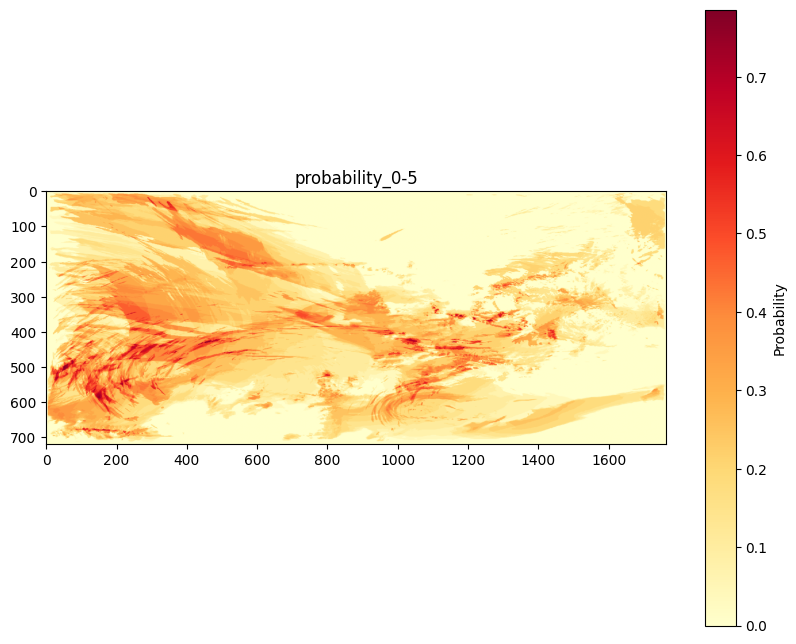

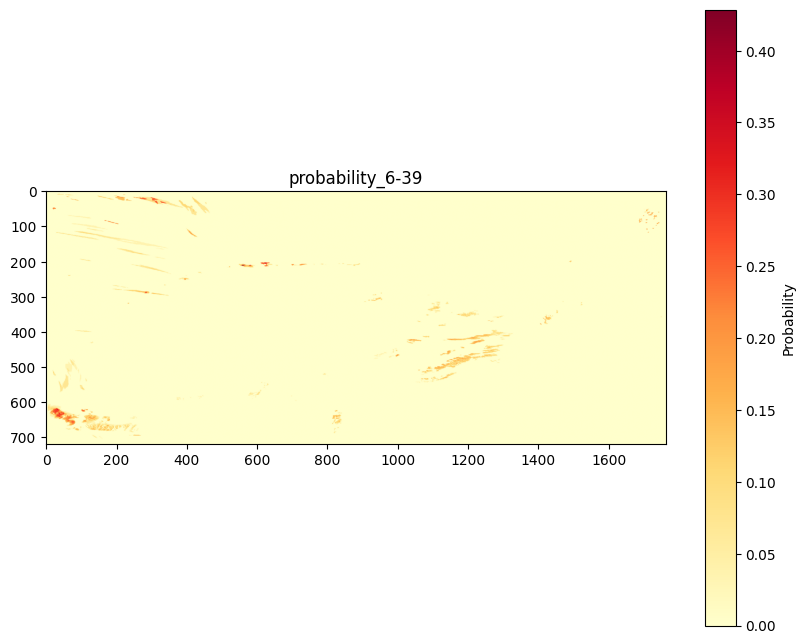

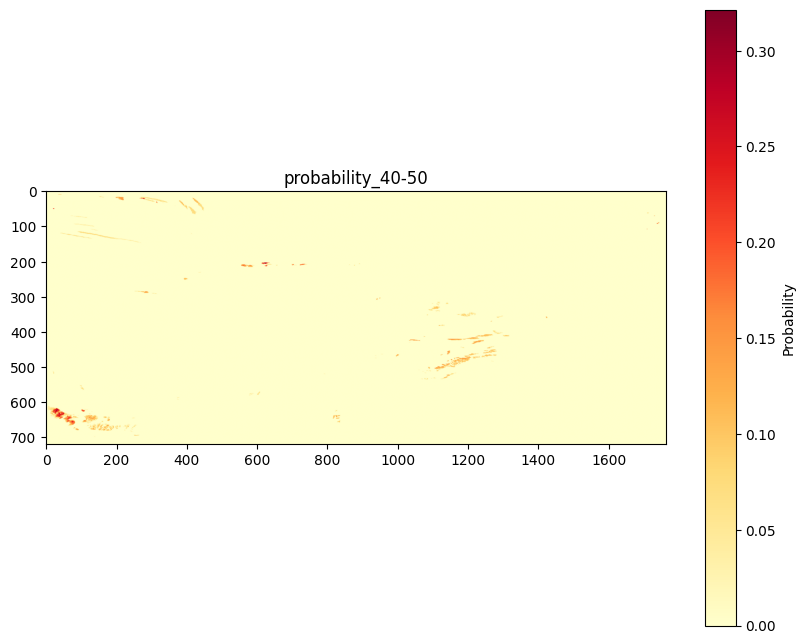

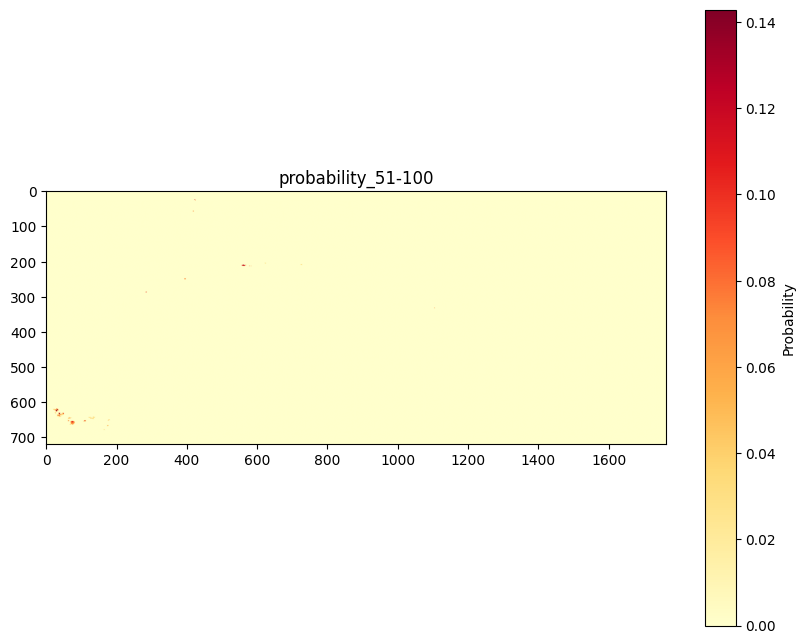

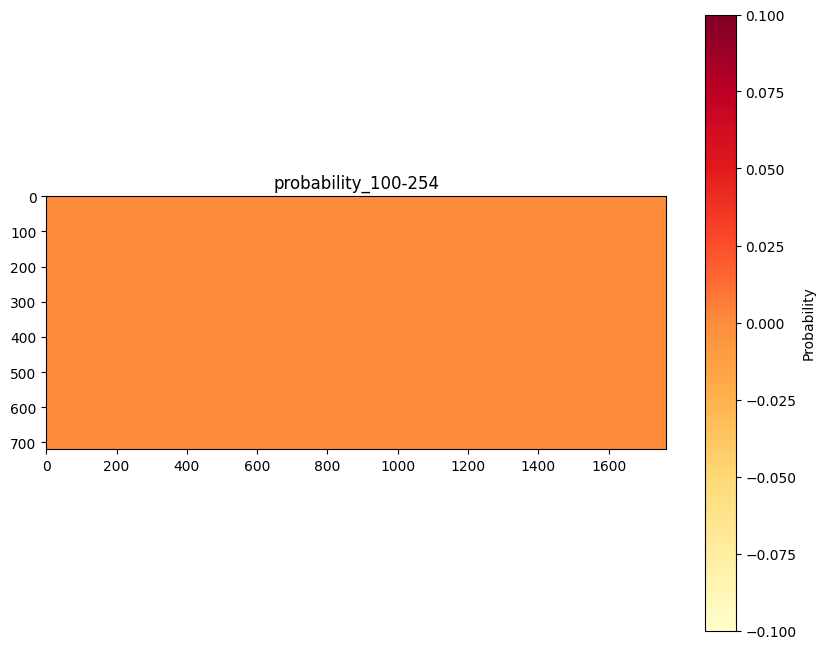

In [35]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np

prob_files = [
    "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_0-5.tif",
    "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_6-39.tif",
    "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_40-50.tif",
    "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_51-100.tif",
    "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_100-254.tif"
]

for tif_path in prob_files:
    with rasterio.open(tif_path) as src:
        arr = src.read(1).astype(float)
        arr = np.where(np.isnan(arr), 0, arr)  # replace NaNs with 0

        plt.figure(figsize=(10,8))
        plt.imshow(arr, cmap='YlOrRd', origin='upper')
        plt.colorbar(label='Probability')
        plt.title(Path(tif_path).stem)
        plt.show()


dev below

dev above

In [29]:
import geopandas as gpd
import rasterio
import rasterio.mask
import numpy as np
from shapely.affinity import translate
from pathlib import Path
import folium
import branca.colormap as cm
import matplotlib.colors as mcolors
from IPython.display import display

# -------------------------------------------------
# 1) Clip probability rasters to alaska boundaries
# -------------------------------------------------
target_crs = "EPSG:4326"
gdf_tx_census = gdf_tx_census.to_crs(target_crs)


prob_files = [
    # "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_0-5.tif",
    # "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_6-39.tif",
    # "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_40-50.tif",
    # "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_51-100.tif",
    # "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_100-254.tif",
    # "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_255plus.tif"

    "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_0-5.tif",
    "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_6-39.tif",
    "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_40-50.tif",
    "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_51-100.tif",
    "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_100-254.tif"


]

out_dir = Path("/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability")
out_dir.mkdir(parents=True, exist_ok=True)

clipped_files = []

for tif_path in prob_files:
    with rasterio.open(tif_path) as src:
        bounds = src.bounds
        is_wrapped = bounds.left > 180

        if is_wrapped:
            texas_geom = gdf_tx_census.copy()
            texas_geom["geometry"] = texas_geom.translate(xoff=360)
        else:
            texas_geom = gdf_tx_census

        shapes = [texas_geom.unary_union.__geo_interface__]

        try:
            out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
            out_meta = src.meta.copy()
            out_meta.update({
                "driver": "GTiff",
                "height": out_image.shape[1],
                "width": out_image.shape[2],
                "transform": out_transform
            })

            out_path = out_dir / Path(tif_path).name
            with rasterio.open(out_path, "w", **out_meta) as dest:
                dest.write(out_image)
            clipped_files.append(str(out_path))

            print(f"✅ Clipped and saved: {out_path}")

        except ValueError as e:
            print(f"⚠️ Skipping {tif_path} — no overlap with Texas: {e}")

# -------------------------------------------------
# 2) Add clipped rasters to Folium map
# -------------------------------------------------
colormap = cm.linear.YlOrRd_09.scale(0, 1)
m = folium.Map(location=[31, -99], zoom_start=6, tiles="CartoDB positron")

for tif_path in clipped_files:
    label = Path(tif_path).stem.replace("probability_", "")

    with rasterio.open(tif_path) as src:
        arr = src.read(1).astype(float)
        arr = np.where(np.isnan(arr), 0, arr)  # NaN → 0

        bounds = [[src.bounds.bottom, src.bounds.left],
                  [src.bounds.top, src.bounds.right]]

        # Apply colormap
        hex_list = [colormap(v) for v in arr.flatten()]
        rgba_list = (mcolors.to_rgba_array(hex_list) * 255).astype(np.uint8)

        # Make probability == 0 fully transparent
        mask_zero = arr.flatten() == 0
        rgba_list[mask_zero, 3] = 0  # Alpha channel → 0

        rgba_img = rgba_list.reshape(arr.shape[0], arr.shape[1], 4)

        folium.raster_layers.ImageOverlay(
            image=rgba_img,
            bounds=bounds,
            name=f"Prob {label}",
            opacity=1.0
        ).add_to(m)

colormap.caption = "Probability of Occurrence"
colormap.add_to(m)
folium.LayerControl().add_to(m)

out_html = str(out_dir / "ensemble_probability_alaska_map.html")
m.save(out_html)
print(f"Map saved -> {out_html}")
display(m)


/tmp/ipython-input-3548798975.py:52: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  shapes = [texas_geom.unary_union.__geo_interface__]


⚠️ Skipping /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_0-5.tif — no overlap with Texas: Input shapes do not overlap raster.
⚠️ Skipping /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_6-39.tif — no overlap with Texas: Input shapes do not overlap raster.
⚠️ Skipping /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_40-50.tif — no overlap with Texas: Input shapes do not overlap raster.
⚠️ Skipping /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_51-100.tif — no overlap with Texas: Input shapes do not overlap raster.
⚠️ Skipping /content/drive/Shareddrives/SC

In [27]:
import os
import geopandas as gpd
import pandas as pd

# --- ROOT DIRECTORY ---
root_dir = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25"

# --- Threshold bins & labels ---
bins = [(0, 5), (6, 39), (40, 50), (51, 100), (100, 254), (255, float('inf'))]
bin_labels = ["0-5", "6-39", "40-50", "51-100", "100-254", "255+"]

# --- Initialize results list ---
summary_rows = []

# --- Walk through experiment folder ---
for method in os.listdir(root_dir):
    method_dir = os.path.join(root_dir, method)
    if not os.path.isdir(method_dir):
        continue

    for date_str in os.listdir(method_dir):
        date_dir = os.path.join(method_dir, date_str)
        if not os.path.isdir(date_dir):
            continue

        # Prepare row dict for this run
        row = {
            "Date of Forecast": date_str,
            "Run Title": f"HRRR Forecast day {abs((pd.to_datetime('2025-10-07') - pd.to_datetime(date_str)).days)+1}" \
                         + (" with enhanced AOI approach" if method == "enhanced" else "")
        }
        # Initialize bin totals
        for label in bin_labels:
            row[label] = 0.0

        # Loop through AOI GeoJSONs
        for file in os.listdir(date_dir):
            if not file.endswith(".geojson"):
                continue

            # Parse threshold from filename (Fxx_T##)
            try:
                threshold = int(file.split("_T")[1].replace("_aois.geojson", ""))
            except:
                continue

            # Load AOIs and compute total area (in km²)
            gdf_aoi = gpd.read_file(os.path.join(date_dir, file))
            if gdf_aoi.empty:
                continue

            # Reproject to equal-area CRS for accurate area calculation
            gdf_aoi = gdf_aoi.to_crs("EPSG:6933")  # Cylindrical Equal Area
            total_area_km2 = gdf_aoi.geometry.area.sum() / 1e6

            # Find bin for threshold
            for (low, high), label in zip(bins, bin_labels):
                if low <= threshold <= high:
                    row[label] += total_area_km2
                    break

        summary_rows.append(row)

# --- Convert to DataFrame ---
df_summary = pd.DataFrame(summary_rows)

# --- Optional: sort by date & method ---
df_summary = df_summary.sort_values(by=["Date of Forecast", "Run Title"])

# --- Save to CSV ---
out_csv = os.path.join(root_dir, "sensitivity_area_summary.csv")
df_summary.to_csv(out_csv, index=False)

print(f"Summary table saved: {out_csv}")
df_summary


Summary table saved: /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/sensitivity_area_summary.csv


,Date of Forecast,Run Title,0-5,6-39,40-50,51-100,100-254,255+
0,2025-10-07,HRRR Forecast day 1,1.691427e+08,122201.647446,24512.524626,513.400064,0.0,0.0
4,2025-10-07,HRRR Forecast day 1 with enhanced AOI approach,1.691427e+08,122201.647446,24512.524626,513.400064,0.0,0.0
1,2025-10-08,HRRR Forecast day 2,4.282679e+07,421267.284729,171919.807718,158.798069,0.0,0.0
5,2025-10-08,HRRR Forecast day 2 with enhanced AOI approach,4.282679e+07,421267.284729,171919.807718,158.798069,0.0,0.0
2,2025-10-09,HRRR Forecast day 3,2.841444e+07,178797.712864,73584.534594,6200.285711,0.0,0.0
6,2025-10-09,HRRR Forecast day 3 with enhanced AOI approach,2.841444e+07,178797.712864,73584.534594,6200.285711,0.0,0.0
3,2025-10-10,HRRR Forecast day 4,1.506875e+08,321686.956187,177578.181505,12712.837311,0.0,0.0
7,2025-10-10,HRRR Forecast day 4 with enhanced AOI approach,1.506875e+08,321686.956187,177578.181505,12712.837311,0.0,0.0


## Create Ensemble Across all AOIS (All days, All FXX, All Thresholds)

In [28]:
import os
import re
import json
import numpy as np
import geopandas as gpd
import rasterio
from rasterio.transform import from_origin
from rasterio.features import rasterize
from rasterio.crs import CRS
import matplotlib.pyplot as plt

# Optional folium preview
try:
    import folium
    from folium.raster_layers import ImageOverlay
    import branca.colormap as bcm
    USE_FOLIUM = True
except Exception:
    USE_FOLIUM = False

# ------------------------------
# Parameters
# ------------------------------
root_dir = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25"
out_dir  = os.path.join(root_dir, "ensemble_probability")
os.makedirs(out_dir, exist_ok=True)

# Threshold bins and labels
bins = [(0, 5), (6, 39), (40, 50), (51, 100), (100, 254), (255, float('inf'))]
bin_labels = ["0-5", "6-39", "40-50", "51-100", "100-254", "255+"]

# Grid resolution in degrees (adjust as needed; ~0.05° ~ 5–6 km near mid-lats)
res_deg = 0.05
crs = CRS.from_epsg(4326)  # WGS84 for simplicity/compatibility

# ------------------------------
# Gather all AOI files with metadata
# ------------------------------
pattern = re.compile(r"F(?P<fxx>\d+)_T(?P<thr>\d+)_aois\.geojson$")

members = []  # list of dicts with metadata and file path
all_bounds = []

for method in os.listdir(root_dir):
    method_dir = os.path.join(root_dir, method)
    if not os.path.isdir(method_dir):
        continue
    for date_str in os.listdir(method_dir):
        date_dir = os.path.join(method_dir, date_str)
        if not os.path.isdir(date_dir):
            continue
        for fn in os.listdir(date_dir):
            if not fn.endswith(".geojson"):
                continue
            m = pattern.search(fn)
            if not m:
                continue
            fxx = int(m.group("fxx"))
            thr = int(m.group("thr"))
            fpath = os.path.join(date_dir, fn)

            # Peek bounds (even empty files will load; guard empties later)
            gdf = gpd.read_file(fpath)
            if not gdf.empty:
                gdf = gdf.to_crs(epsg=4326)
                all_bounds.append(gdf.total_bounds.tolist())

            members.append({
                "method": method,
                "date": date_str,
                "fxx": fxx,
                "thr": thr,
                "path": fpath,
            })

if not members:
    raise RuntimeError("No AOI GeoJSON files found. Check your experiment output paths.")

# If everything was empty, set a default extent (fallback)
if not all_bounds:
    # Texas-ish fallback; adjust if needed
    west, south, east, north = (-107.0, 25.0, -93.0, 37.5)
else:
    all_bounds = np.array(all_bounds)
    west  = float(np.min(all_bounds[:,0]))
    south = float(np.min(all_bounds[:,1]))
    east  = float(np.max(all_bounds[:,2]))
    north = float(np.max(all_bounds[:,3]))

# Expand bounds by a small margin
pad = 0.25
west  -= pad
south -= pad
east  += pad
north += pad

# Build grid geometry
width  = int(np.ceil((east - west) / res_deg))
height = int(np.ceil((north - south) / res_deg))
transform = from_origin(west, north, res_deg, res_deg)

print(f"Grid: {width} x {height} @ {res_deg}°; bounds W{west:.3f} S{south:.3f} E{east:.3f} N{north:.3f}")

# ------------------------------
# Utility: map threshold value to bin label
# ------------------------------
def threshold_to_bin_label(thr: int) -> str:
    for (lo, hi), label in zip(bins, bin_labels):
        if lo <= thr <= hi:
            return label
    # default, shouldn't happen
    return "UNBINNED"

# ------------------------------
# Prepare accumulators per bin
# ------------------------------
counts_by_bin = {lbl: np.zeros((height, width), dtype=np.uint16) for lbl in bin_labels}
denom_by_bin  = {lbl: 0 for lbl in bin_labels}

# ------------------------------
# Rasterize each member into its bin
# ------------------------------
for mem in members:
    lbl = threshold_to_bin_label(mem["thr"])
    denom_by_bin[lbl] += 1  # this member contributes to denominator, even if empty

    gdf = gpd.read_file(mem["path"])
    if gdf.empty:
        continue

    # Ensure WGS84
    gdf = gdf.to_crs(epsg=4326)
    # Rasterize AOIs as 1s, then accumulate
    shapes = [(geom, 1) for geom in gdf.geometry if geom and not geom.is_empty]
    if not shapes:
        continue

    tmp = rasterize(
        shapes=shapes,
        out_shape=(height, width),
        transform=transform,
        fill=0,
        default_value=1,
        dtype=np.uint8
    )
    counts_by_bin[lbl] += tmp.astype(np.uint16)

# ------------------------------
# Compute probabilities and write GeoTIFFs
# ------------------------------
prob_paths = {}  # bin_label -> GeoTIFF path

for lbl in bin_labels:
    denom = denom_by_bin[lbl]
    if denom == 0:
        print(f"[WARN] No members found for bin {lbl}; skipping.")
        continue

    prob = counts_by_bin[lbl].astype(np.float32) / float(denom)  # 0..1
    prob = np.clip(prob, 0.0, 1.0)

    tif_path = os.path.join(out_dir, f"probability_{lbl.replace('+','plus')}.tif")
    profile = {
        "driver": "GTiff",
        "height": prob.shape[0],
        "width": prob.shape[1],
        "count": 1,
        "dtype": "float32",
        "crs": crs,
        "transform": transform,
        "compress": "lzw"
    }
    with rasterio.open(tif_path, "w", **profile) as dst:
        dst.write(prob, 1)

    prob_paths[lbl] = tif_path
    print(f"Saved {lbl} probability GeoTIFF -> {tif_path}")

# ------------------------------
# Optional: quick Folium viewer (writes PNG overlays)
# ------------------------------
if USE_FOLIUM and prob_paths:
    m = folium.Map(location=[(south+north)/2, (west+east)/2], zoom_start=6, tiles="CartoDB positron")

    for lbl, tif_path in prob_paths.items():
        with rasterio.open(tif_path) as src:
            arr = src.read(1)  # float32 0..1
            # Make a PNG (0..255) with alpha
            arr_norm = np.clip(arr, 0, 1)
            # Create RGBA (simple grayscale) for quick overlay
            rgba = np.zeros((arr_norm.shape[0], arr_norm.shape[1], 4), dtype=np.uint8)
            gray = (arr_norm * 255).astype(np.uint8)
            rgba[..., 0] = gray
            rgba[..., 1] = gray
            rgba[..., 2] = gray
            rgba[..., 3] = (arr_norm * 255).astype(np.uint8)  # alpha by probability

            png_path = os.path.join(out_dir, f"probability_{lbl.replace('+','plus')}.png")
            # Save PNG
            plt.figure(figsize=(6,6))
            plt.axis('off')
            plt.imshow(rgba)
            plt.savefig(png_path, bbox_inches='tight', pad_inches=0)
            plt.close()

            # Overlay bounds
            b = src.bounds  # left, bottom, right, top
            img_overlay = ImageOverlay(
                name=f"Prob {lbl}",
                image=png_path,
                bounds=[[b.bottom, b.left], [b.top, b.right]],
                opacity=0.7,
                interactive=False,
                cross_origin=False
            )
            img_overlay.add_to(m)

        # Add a legend (shared)
    folium.LayerControl(collapsed=False).add_to(m)
    html_path = os.path.join(out_dir, "ensemble_probability_map.html")
    m.save(html_path)
    print(f"Folium map saved -> {html_path}")

# ------------------------------
# Also save a small JSON manifest for reproducibility
# ------------------------------
manifest = {
    "root_dir": root_dir,
    "out_dir": out_dir,
    "grid": {
        "bounds": {"west": west, "south": south, "east": east, "north": north},
        "resolution_deg": res_deg,
        "width": width, "height": height,
        "crs": "EPSG:4326"
    },
    "bins": [{"label": l, "range": r} for l, r in zip(bin_labels, bins)],
    "denominators": denom_by_bin,
    "probability_tifs": prob_paths
}
with open(os.path.join(out_dir, "ensemble_manifest.json"), "w") as f:
    json.dump(manifest, f, indent=2)
print("Wrote ensemble_manifest.json")


Grid: 1764 x 719 @ 0.05°; bounds W156.254 S41.402 E244.407 N77.304
Saved 0-5 probability GeoTIFF -> /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_0-5.tif
Saved 6-39 probability GeoTIFF -> /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_6-39.tif
Saved 40-50 probability GeoTIFF -> /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_40-50.tif
Saved 51-100 probability GeoTIFF -> /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/Alaska_10_30_25/ensemble_probability/probability_51-100.tif
Saved 100-254 probability GeoTIFF -> /content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensiti

# Ensemble Map For all of US

In [ ]:
# import folium
# import rasterio
# import numpy as np
# import branca.colormap as cm
# import matplotlib.colors as mcolors
# from IPython.display import display

# # Paths to your probability GeoTIFFs
# prob_files = [
#     "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_0-5.tif",
#     "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_6-39.tif",
#     "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_40-50.tif",
#     "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_51-100.tif",
#     "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_100-254.tif",
#     "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/probability_255plus.tif"
# ]

# # Create continuous colormap (Yellow→Orange→Red)
# colormap = cm.linear.YlOrRd_09.scale(0, 1)

# # Initialize folium map
# m = folium.Map(location=[37, -96], zoom_start=4, tiles="CartoDB positron")

# for tif_path in prob_files:
#     label = tif_path.split("/")[-1].replace("probability_", "").replace(".tif", "")

#     with rasterio.open(tif_path) as src:
#         arr = src.read(1).astype(float)
#         arr = np.where(np.isnan(arr), 0, arr)  # Replace NaN with 0

#         bounds = [[src.bounds.bottom, src.bounds.left],
#                   [src.bounds.top, src.bounds.right]]

#         # Apply colormap to nonzero values, fallback transparent for 0
#         hex_list = [colormap(v) if v > 0 else "#00000000" for v in arr.flatten()]

#         # Convert hex → RGBA (0–255 uint8)
#         rgba_list = (mcolors.to_rgba_array(hex_list) * 255).astype(np.uint8)

#         # Reshape back to (height, width, 4)
#         rgba_img = rgba_list.reshape(arr.shape[0], arr.shape[1], 4)

#         folium.raster_layers.ImageOverlay(
#             image=rgba_img,
#             bounds=bounds,
#             name=f"Prob {label}",
#             opacity=1.0  # now opacity is per-pixel
#         ).add_to(m)

# # Add legend & controls
# colormap.caption = "Probability of Occurrence"
# colormap.add_to(m)
# folium.LayerControl().add_to(m)

# out_html = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/ensemble_probability_color_map.html"
# m.save(out_html)
# print(f"Map saved -> {out_html}")
# display(m)


## Clip Ensemble to Texas

# Verficaiton

## Bring in Flight captured UAV flood map product to be considered truth


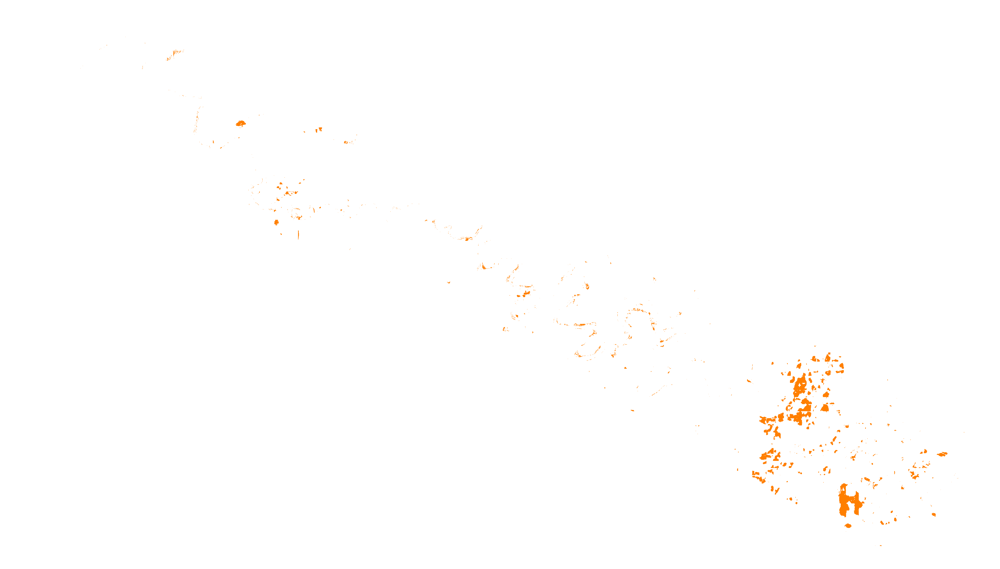
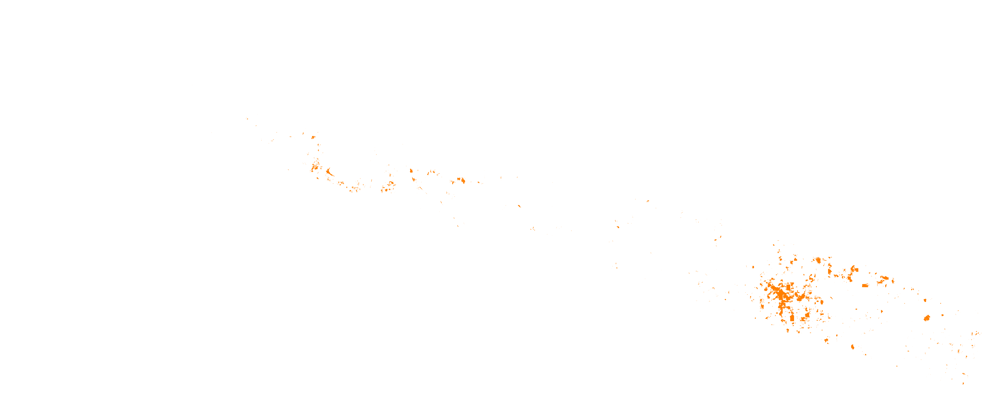
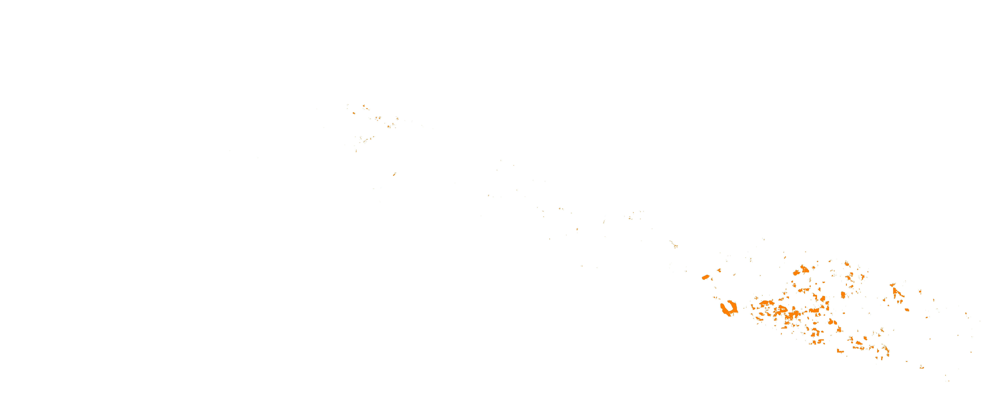
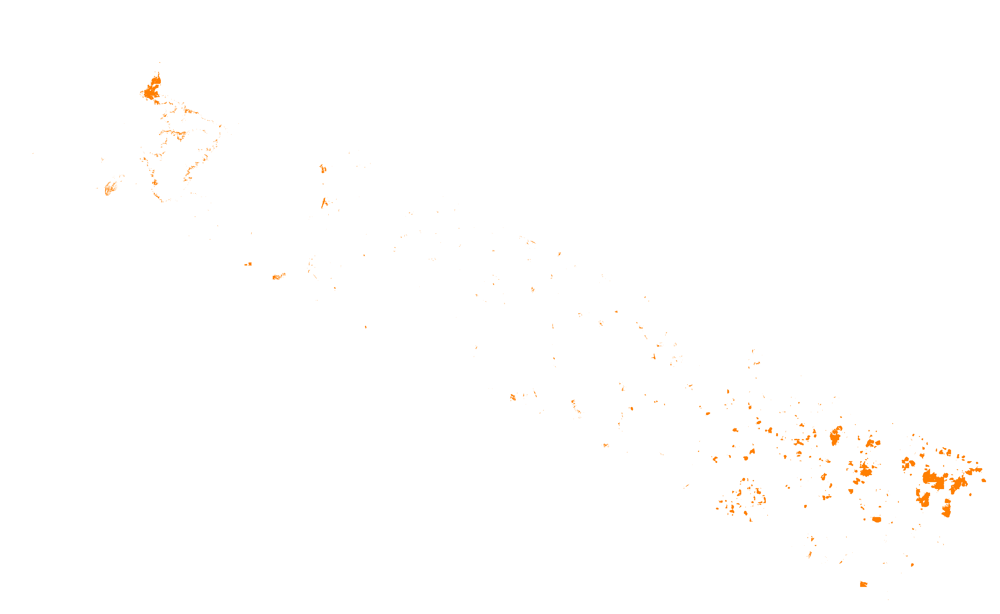
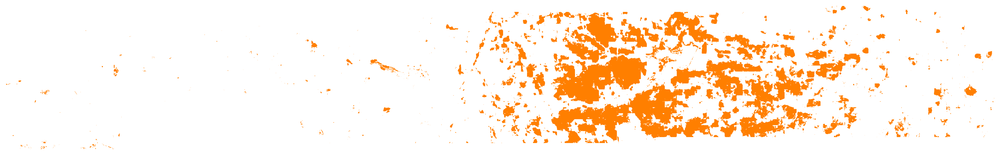
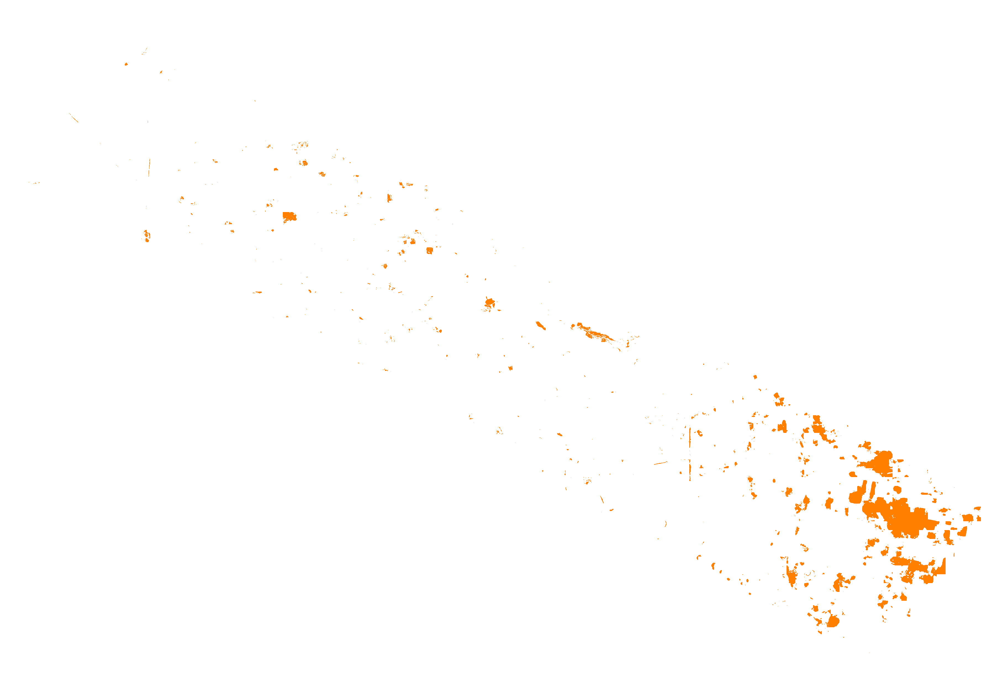
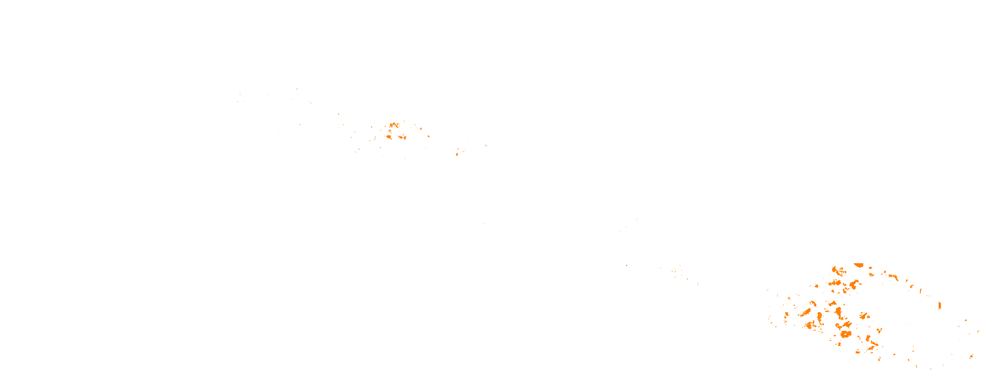

In [ ]:
# 4. Visualize all downloaded _UNet_class.tif files on a map with color legend
import folium
import rasterio
import numpy as np
import matplotlib.colors as mcolors
import os
from folium.raster_layers import ImageOverlay

# Folder containing downloaded files
folder_path = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/UAV_Collection/"

# Find all _UNet_class.tif files
tif_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith("_UNet_class.tif")]

# Create a base map (centered on the first raster)
with rasterio.open(tif_files[0]) as r:
    bounds = r.bounds
    m = folium.Map(location=[(bounds.top + bounds.bottom)/2, (bounds.left + bounds.right)/2],
                   zoom_start=12)

# Custom color ramp and class descriptions
class_colors = {
    1: {"color": "#1f78b4", "label": "Water"},
    2: {"color": "#33a02c", "label": "Vegetation"},
    3: {"color": "#e31a1c", "label": "Built-up"},
    4: {"color": "#ff7f00", "label": "Bare Soil"}
}
colors = [v["color"] for v in class_colors.values()]
cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(boundaries=[1,2,3,4,5], ncolors=cmap.N)

# Loop over all rasters
for tif in tif_files:
    with rasterio.open(tif) as raster:
        data = raster.read(1)

        # Mask zeros
        masked_data = np.ma.masked_equal(data, 0)

        # Convert masked data to RGBA image
        rgba_img = cmap(norm(masked_data.filled(1)))  # fill masked with 1 to map to first color
        rgba_img = (rgba_img * 255).astype(np.uint8)

        # Make masked pixels fully transparent
        rgba_img[masked_data.mask, 3] = 0

        # Get raster bounds
        bounds = raster.bounds

        # Overlay the image
        layer_name = os.path.basename(tif)
        ImageOverlay(
            image=rgba_img,
            bounds=[[bounds.bottom, bounds.left], [bounds.top, bounds.right]],
            opacity=0.8,
            interactive=True,
            cross_origin=False,
            name=layer_name,
            zindex=1
        ).add_to(m)

# Add layer control to toggle rasters
folium.LayerControl().add_to(m)

# Add a color legend
legend_html = '''
<div style="position: fixed;
            bottom: 50px; left: 50px; width: 150px; height: 140px;
            border:2px solid grey; z-index:9999; font-size:14px;
            background-color:white; opacity: 0.9;
            padding: 10px;">
<b>Class Legend</b><br>
'''
for c, info in class_colors.items():
    legend_html += f'<i style="background:{info["color"]};width:15px;height:15px;float:left;margin-right:5px;"></i>{info["label"]}<br>'
legend_html += '</div>'

m.get_root().html.add_child(folium.Element(legend_html))

# Display the map
m


## Summary Table

### Precompute truth set area

In [ ]:
import rasterio
import numpy as np
import pandas as pd
import os
from rasterio.warp import reproject, Resampling, calculate_default_transform
from rasterio.enums import Resampling as ResamplingEnum
from rasterio.io import MemoryFile

truth_folder = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/UAV_Collection/"
target_crs = "EPSG:6933"  # Cylindrical Equal Area

truth_rows = []

for file in os.listdir(truth_folder):
    if file.endswith(".tif"):
        raster_path = os.path.join(truth_folder, file)
        with rasterio.open(raster_path) as src:
            # --- Reproject to equal-area ---
            transform, width, height = calculate_default_transform(
                src.crs, target_crs, src.width, src.height, *src.bounds
            )

            kwargs = src.meta.copy()
            kwargs.update({
                'crs': target_crs,
                'transform': transform,
                'width': width,
                'height': height
            })

            with MemoryFile() as memfile:
                with memfile.open(**kwargs) as dst:
                    reproject(
                        source=rasterio.band(src, 1),
                        destination=rasterio.band(dst, 1),
                        src_transform=src.transform,
                        src_crs=src.crs,
                        dst_transform=transform,
                        dst_crs=target_crs,
                        resampling=ResamplingEnum.nearest
                    )

                    data = dst.read(1, masked=True)
                    pixel_size_x, pixel_size_y = dst.res
                    pixel_area_km2 = abs(pixel_size_x * pixel_size_y) / 1e6  # m² → km²
                    valid_pixels = np.count_nonzero(~data.mask)
                    total_area_km2 = valid_pixels * pixel_area_km2

            truth_rows.append({
                "Truth_File": file,
                "Truth_Area_km2": total_area_km2
            })

df_truth = pd.DataFrame(truth_rows)
print(df_truth)


## Step 2

In [ ]:
import os
import pandas as pd
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import numpy as np
from pathlib import Path

# Folder with original rasters
prob_folder = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/clipped_texas"
target_crs = "EPSG:6933"  # equal-area for area calculation

summary_rows = []

for file in os.listdir(prob_folder):
    if not file.endswith(".tif"):
        continue

    tif_path = os.path.join(prob_folder, file)

    with rasterio.open(tif_path) as src:
        # Prepare reprojection if not already in EPSG:6933
        if src.crs.to_string() != target_crs:
            transform, width, height = calculate_default_transform(
                src.crs, target_crs, src.width, src.height, *src.bounds)

            kwargs = src.meta.copy()
            kwargs.update({
                'crs': target_crs,
                'transform': transform,
                'width': width,
                'height': height
            })

            # Create in-memory array for reprojected raster
            reprojected = np.empty((src.count, height, width), dtype=src.dtypes[0])

            for i in range(src.count):
                reproject(
                    source=rasterio.band(src, i + 1),
                    destination=reprojected[i],
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=target_crs,
                    resampling=Resampling.nearest
                )
            data = reprojected[0]  # assume single-band
        else:
            data = src.read(1, masked=True)
            transform = src.transform

        # Compute pixel area in km²
        pixel_area_km2 = abs(transform.a * transform.e) / 1e6

        # Only count pixels >0
        valid_pixels = np.count_nonzero(data > 0)
        total_area_km2 = valid_pixels * pixel_area_km2

        summary_rows.append({
            "Bin_Label": Path(file).stem,
            "AOI_File": file,
            "AOI_Area_km2": total_area_km2,
            "Truth_File": None,
            "Truth_Area_km2": None,
            "Percent_Overlap": None
        })

df_summary = pd.DataFrame(summary_rows)
print(df_summary)


             Bin_Label                 AOI_File   AOI_Area_km2 Truth_File  \
0      probability_0-5      probability_0-5.tif  224013.315844       None   
1     probability_6-39     probability_6-39.tif   13210.776027       None   
2    probability_40-50    probability_40-50.tif    5621.055682       None   
3   probability_51-100   probability_51-100.tif     103.613930       None   
4  probability_100-254  probability_100-254.tif       0.000000       None   
5  probability_255plus  probability_255plus.tif       0.000000       None   

  Truth_Area_km2 Percent_Overlap  
0           None            None  
1           None            None  
2           None            None  
3           None            None  
4           None            None  
5           None            None  


Step 3: Calculate Overlap and Fill Table

In [ ]:
# -------------------------------
# Step 3: Compute Percent Overlap
# -------------------------------
def load_raster_for_overlap(raster_path):
    """Load raster and reproject to EPSG:6933 if needed."""
    with rasterio.open(raster_path) as src:
        if src.crs.to_string() != target_crs:
            transform, width, height = calculate_default_transform(
                src.crs, target_crs, src.width, src.height, *src.bounds
            )
            reprojected = np.empty((src.count, height, width), dtype=src.dtypes[0])
            for i in range(src.count):
                reproject(
                    source=rasterio.band(src, i + 1),
                    destination=reprojected[i],
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=target_crs,
                    resampling=Resampling.nearest
                )
            data = reprojected[0]
        else:
            data = src.read(1, masked=True)
        return data

# Folder paths
prob_folder_path = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/Sensitivity_Experiment/ensemble_probability/clipped_texas"
truth_folder_path = "/content/drive/Shareddrives/SCO-Shared/Thematic Service Areas/WaterSecurity/Pipecast/UAV_Collection/"

# Loop through AOI rasters
for i, row in df_summary.iterrows():
    aoi_path = os.path.join(prob_folder_path, row["AOI_File"])
    aoi_data = load_raster_for_overlap(aoi_path)

    best_overlap = 0
    matched_truth = None
    matched_truth_area = None

    # Compare with UAV truth rasters
    for j, truth_row in df_truth.iterrows():
        truth_path = os.path.join(truth_folder_path, truth_row["Truth_File"])
        truth_data = load_raster_for_overlap(truth_path)

        # Align arrays (simple trim to smallest dimensions)
        min_rows = min(aoi_data.shape[0], truth_data.shape[0])
        min_cols = min(aoi_data.shape[1], truth_data.shape[1])
        overlap_pixels = np.count_nonzero((aoi_data[:min_rows, :min_cols] > 0) &
                                          (truth_data[:min_rows, :min_cols] > 0))

        # Compute percent overlap
        pixel_area_km2 = abs(aoi_data.shape[0] * aoi_data.shape[1])  # approximate
        percent_overlap = (overlap_pixels / (truth_row["Truth_Area_km2"] / (1e-6))) / 100 if truth_row["Truth_Area_km2"] else 0

        if percent_overlap > best_overlap:
            best_overlap = percent_overlap
            matched_truth = truth_row["Truth_File"]
            matched_truth_area = truth_row["Truth_Area_km2"]

    # Fill results in df_summary
    df_summary.at[i, "Truth_File"] = matched_truth
    df_summary.at[i, "Truth_Area_km2"] = matched_truth_area
    df_summary.at[i, "Percent_Overlap"] = best_overlap

print(df_summary)
